Files already downloaded and verified
Epoch 0/50, d_loss: 100.0, g_loss: 0.0


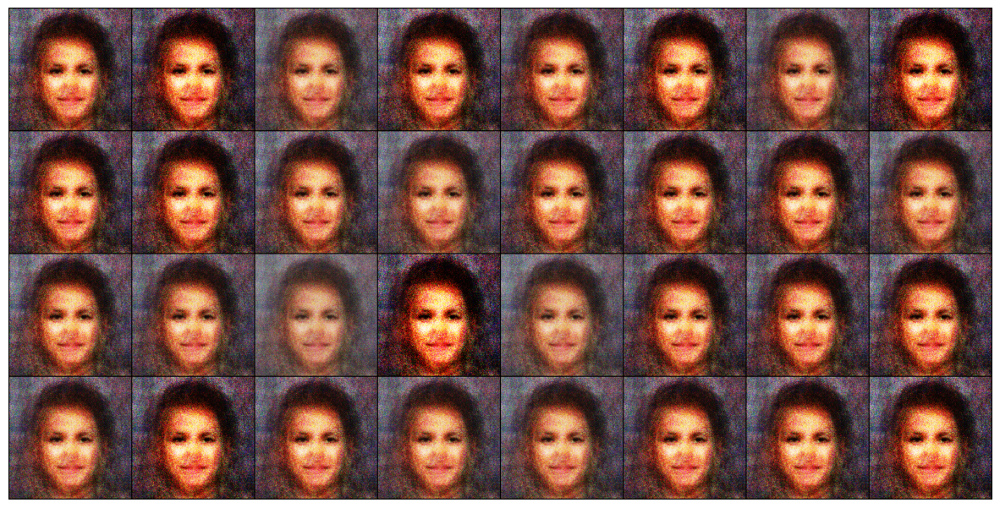

Epoch 1/50, d_loss: 100.0, g_loss: 0.0


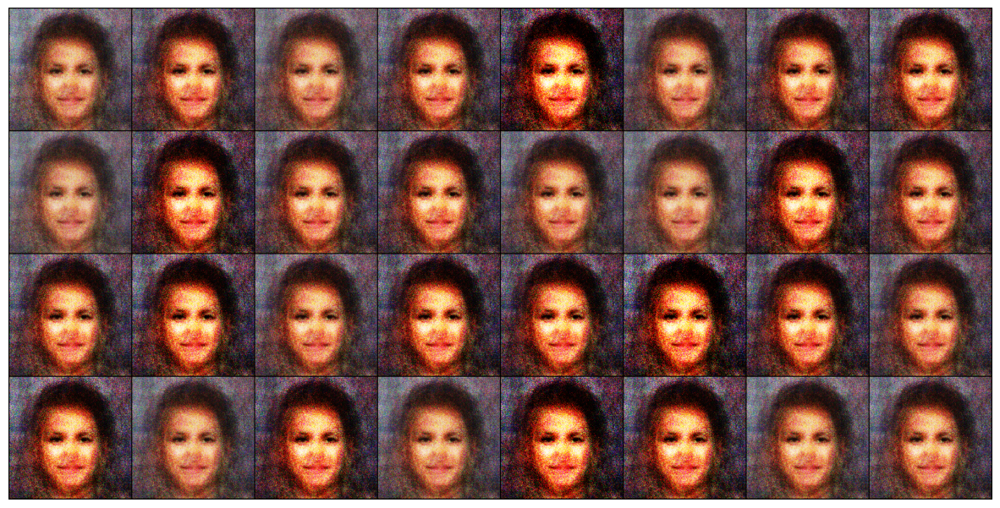

Epoch 2/50, d_loss: 100.0, g_loss: 0.0


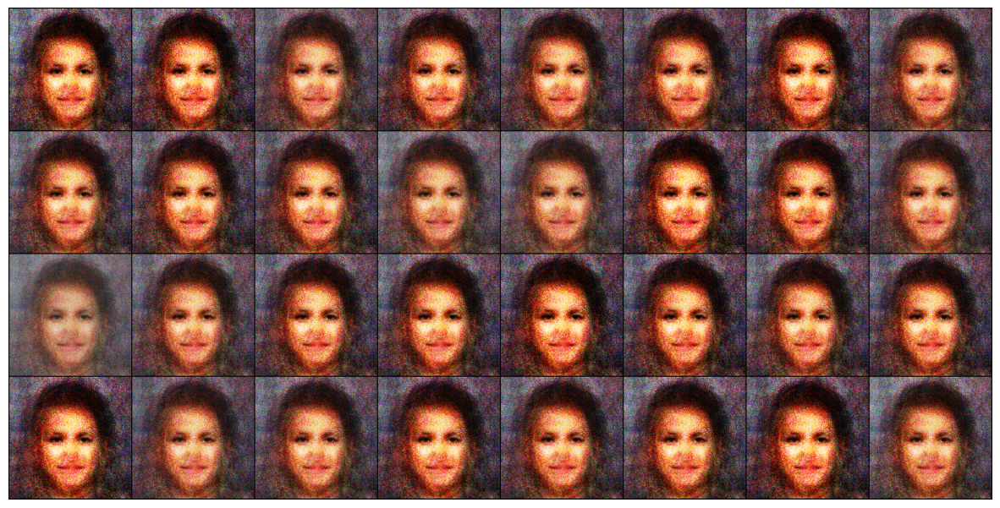

Epoch 3/50, d_loss: 100.0, g_loss: 0.0


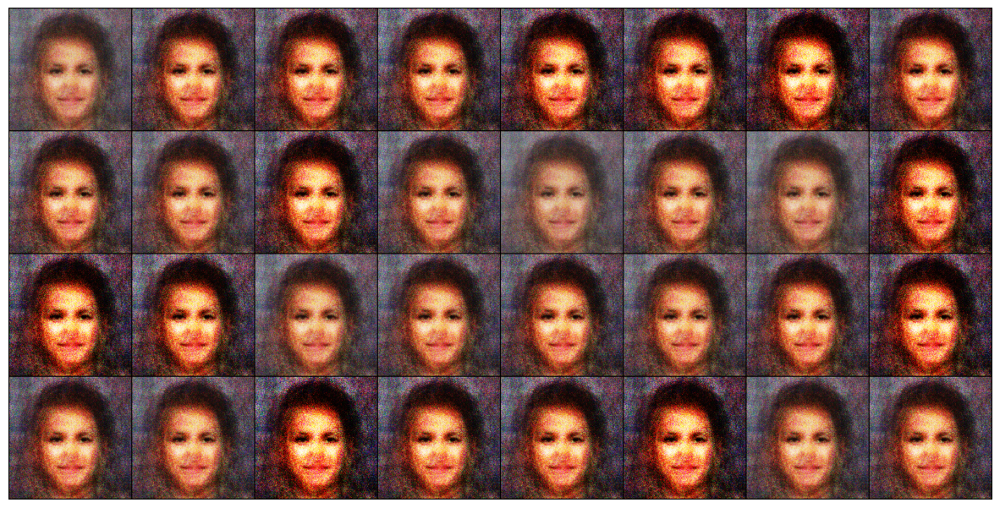

Epoch 4/50, d_loss: 100.0, g_loss: 0.0


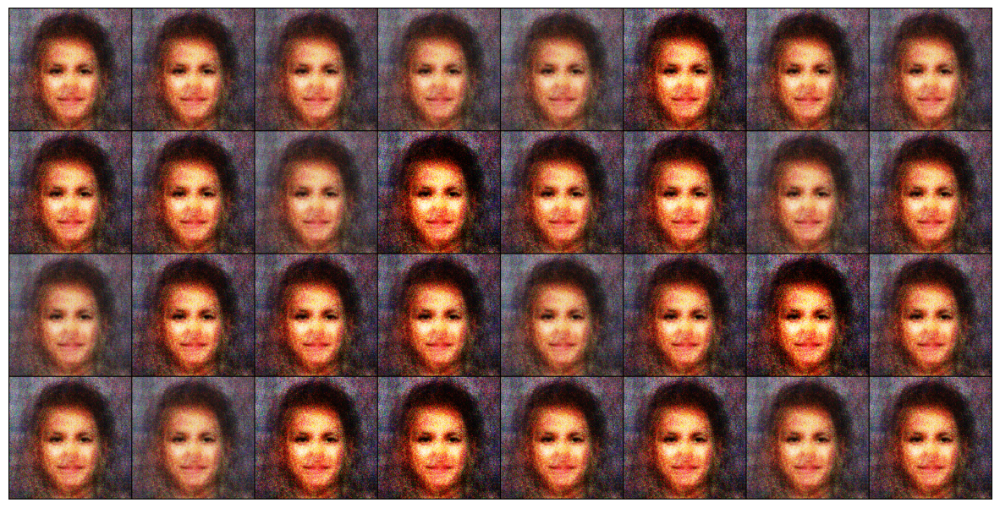

Epoch 5/50, d_loss: 100.0, g_loss: 0.0


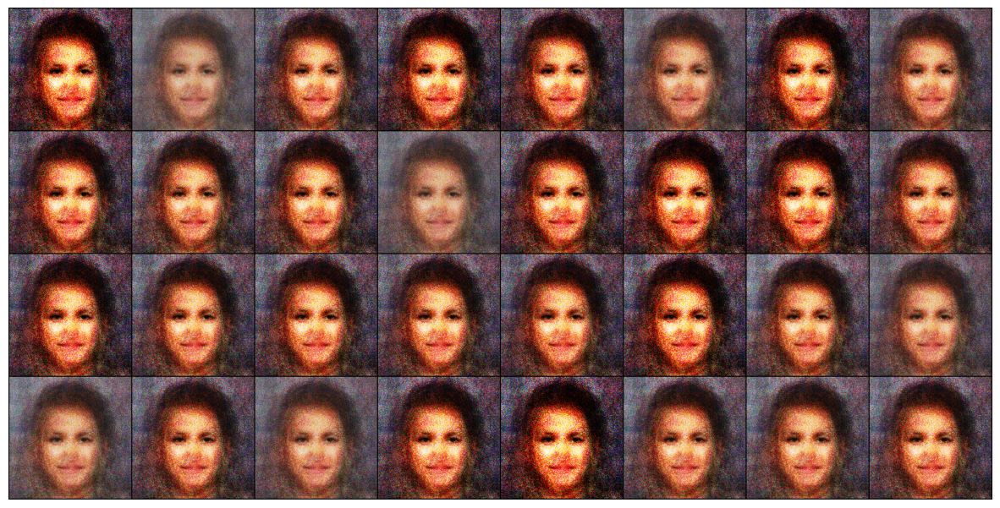

Epoch 6/50, d_loss: 100.0, g_loss: 0.0


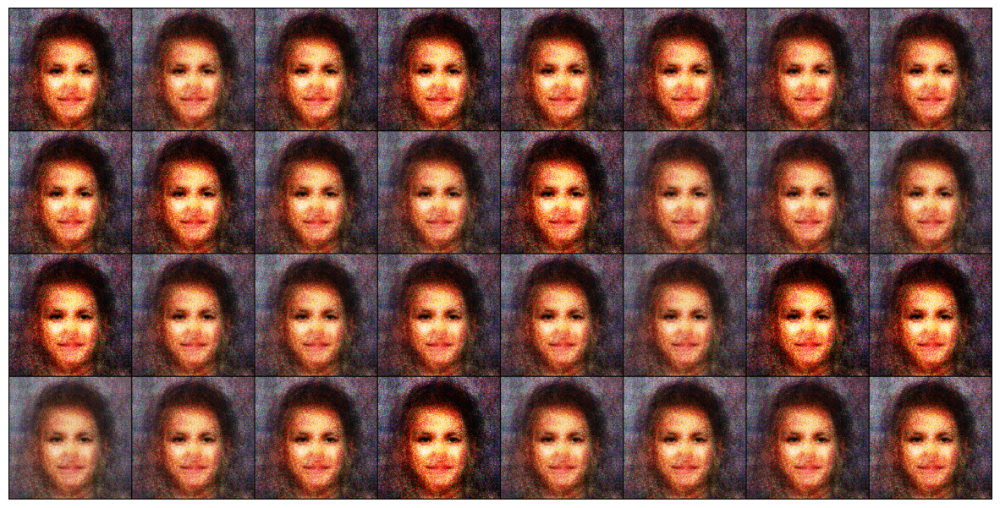

Epoch 7/50, d_loss: 100.0, g_loss: 0.0


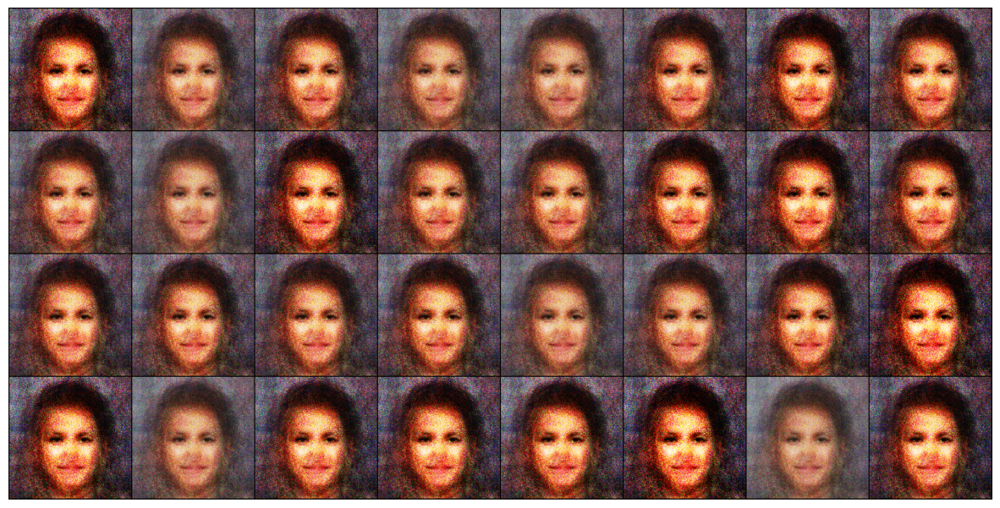

KeyboardInterrupt: 

In [5]:
import torch
from torch import nn
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.autograd.variable import Variable
import matplotlib.pyplot as plt

device = 'mps'

# Load the CelebA dataset
transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

dataset = datasets.CelebA(root='.', transform=transform, download=True)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)

# Define the Generator and Discriminator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            # Fully connected layer
            nn.Linear(100, 256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Linear(1024, 3*256*256),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x).view(x.size(0), 3, 256, 256)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(3*256*256, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x.view(x.size(0), -1))

# Create the models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Define the optimizers and the loss function
optimizer_g = torch.optim.Adam(generator.parameters(), lr=0.0002)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=0.0002)

loss = nn.BCELoss()

# Train the GAN
num_epochs = 50
for epoch in range(num_epochs):
    for n, (real_images, _) in enumerate(dataloader):
        real_images = real_images.to(device)

        # Train discriminator
        optimizer_d.zero_grad()

        real_labels = torch.ones(real_images.size(0), 1).to(device)
        fake_labels = torch.zeros(real_images.size(0), 1).to(device)

        outputs = discriminator(real_images)
        d_loss_real = loss(outputs, real_labels)

        z = torch.randn(real_images.size(0), 100).to(device)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = loss(outputs, fake_labels)

        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_d.step()

        # Train generator
        optimizer_g.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = loss(outputs, real_labels)

        g_loss.backward()
        optimizer_g.step()

    # Print losses
    print(f"Epoch {epoch}/{num_epochs}, d_loss: {d_loss.item()}, g_loss: {g_loss.item()}")

    z = torch.randn(32, 100).to(device)
    fake_images = generator(z)
    fake_images = (fake_images + 1.0) / 2.0  # Rescale to [0, 1]

    grid = make_grid(fake_images.cpu(), nrow=8)  # Convert batch of images to a grid

    # The shape of `grid` will be [3, H, W]. We have to change it to [H, W, 3] before displaying
    grid = grid.numpy().transpose((1, 2, 0))

    # Display the grid of images
    plt.figure(figsize=(15,15))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

# Generate a batch of images
z = torch.randn(32, 100).to(device)
fake_images = generator(z)
fake_images = (fake_images + 1.0) / 2.0  # Rescale to [0, 1]

grid = make_grid(fake_images.cpu(), nrow=8)  # Convert batch of images to a grid

# The shape of `grid` will be [3, H, W]. We have to change it to [H, W, 3] before displaying
grid = grid.numpy().transpose((1, 2, 0))

# Display the grid of images
plt.figure(figsize=(15,15))
plt.imshow(grid)
plt.axis('off')
plt.show()

# Save the images
save_image(fake_images, 'fake_images.png')
